# AI assignment


---


### VinBigData Chest X-ray Abnormalities Detection



---

In this report, you will find the process that leads to the construction of a deep learning pipeline to address the following problem: Automatically localize and classify thoracic abnormalities from chest radiographs. This problem, which involved 1275 teams, was proposed by the Vingroup Big Data Institute in 2021 during an [open competition on the kaggle platform](#https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection).

The data being provided by the company in charge of the competition, our pipeline will start with the data preprocessing and will end with the testing of our developed model. Among the technological bricks included in our ensemble, we will find, the application of a Weighted-Boxes-Fusion algorithm allowing the denoising of our dataset, the implementation of neural network models ported to the computer vision such as YOLOv5 used for object recognition ,or a binary classifier based on a convolutional neural network architecture called EffNet.

The best team of this competition will have obtained a score of 0,314, our solution will have obtained a score of 0,21 allowing to foresee still improvement axes.

# Advice for use

---

This prototype notebook gathers all the code having allowed the development of a system answering the problematic explained above. Therefore you will find in this notebook the code corresponding to the validation and training phases of the different models. In order not to have to repeat these steps (about 4 hours) you will find in the submited directory filescorresponding to the best weights of the models used after training.

Yolov5 : best.pt
Effnet b3 : model.pth

To use this :


# Table of Contents
---

1. [Data exploration](#https://colab.research.google.com/drive/1CBl7mHVAynEv13IJRE82t5IQf0mQLh0E#scrollTo=TD2j0QdMtWjs&line=1&uniqifier=1)
2. Example2
3. Third Example
4. Fourth Example

# Reference


---

[1] https://www.kaggle.com/competitions/vinbigdata-chest-xray-abnormalities-detection/discussion/229696

[2] https://www.kaggle.com/competitions/vinbigdata-chest-xray-abnormalities-detection/discussion/229687

[3] https://www.kaggle.com/code/awsaf49/vinbigdata-cxr-ad-yolov5-14-class-train

[4] https://www.kaggle.com/code/awsaf49/vinbigdata-2-class-filter

[5] https://www.kaggle.com/code/corochann/vinbigdata-2-class-classifier-complete-pipeline

[6] https://www.kaggle.com/code/mrinath/2-class-classifier-pipeline-using-effnet

## Setup
Import kaggle API key to allowing easy dataset downloading

In [ ]:
# Colab library to upload files to notebook
from google.colab import files

In [ ]:
# Upload kaggle API key file
uploaded = files.upload()

Saving kaggle.json to kaggle.json


In [ ]:
!ls -lha kaggle.json
!pip install -q kaggle # installing the kaggle package
!mkdir -p ~/.kaggle # creating .kaggle folder where the key should be placed
!cp kaggle.json ~/.kaggle/ # move the key to the folder
!pwd # checking the present working directory

-rw-r--r-- 1 root root 68 Mar 25 15:17 kaggle.json
/content


In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
import numpy as np, pandas as pd
from glob import glob
import shutil, os
import matplotlib.pyplot as plt
from sklearn.model_selection import GroupKFold
from tqdm.notebook import tqdm
import seaborn as sns

from os import listdir
from os.path import isfile, join
import yaml

In [ ]:
dim = 512 #512, 256, 'original'

In [ ]:
!kaggle datasets download -d awsaf49/vinbigdata-{dim}-image-dataset

 99% 2.29G/2.30G [00:24<00:00, 133MB/s]
100% 2.30G/2.30G [00:24<00:00, 101MB/s]


In [ ]:
!unzip '/content/vinbigdata-{dim}-image-dataset.zip'

In [ ]:
import os

root_dir = os.path.abspath(os.path.join(os.getcwd(), ""))
root_dir

'/content'

In [ ]:
!mv vinbigdata vinbigdata-{dim}-image-dataset

# Data exploration

In [ ]:
# create a dataframe containing the test dataset informations
train_df = pd.read_csv(f'vinbigdata-{dim}-image-dataset/train.csv')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072


# YOLOv5

## Data formating


Creation of the images path that will be use by our model


In [ ]:
train_df['image_path'] = f'vinbigdata-{dim}-image-dataset/train/'+train_df.image_id+('.png' if dim!='original' else '.jpg')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580,vinbigdata-512-image-dataset/train/50a418190bc...
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159,vinbigdata-512-image-dataset/train/21a10246a5e...
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336,vinbigdata-512-image-dataset/train/9a5094b2563...
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880,vinbigdata-512-image-dataset/train/051132a778e...
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072,vinbigdata-512-image-dataset/train/063319de25c...


YOLO model need to be train only on images with at least one detection: Remove of all the images with the class name "no fiding"

In [ ]:
train_df = train_df[train_df.class_id!=14].reset_index(drop = True)

### Format YOLO fashion boxes coordinates

Convertion from Pascal voc boxes to coordinates to YOLO boxes coordinates
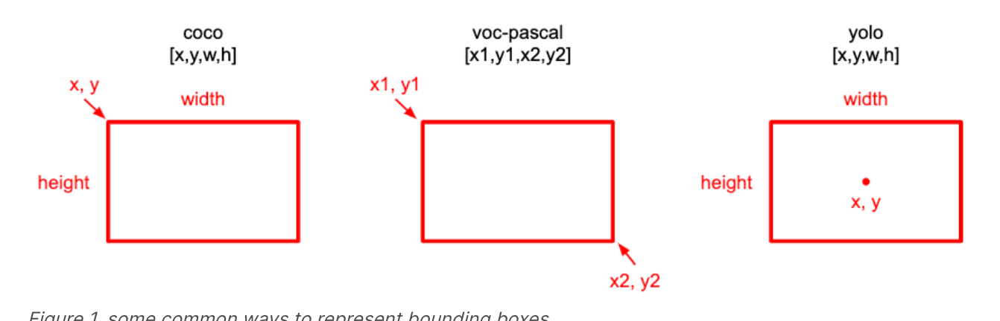

In [ ]:
def convert_pascal_to_yolo(df):
  df['x_min'] = df.apply(lambda row: (row.x_min)/row.width, axis =1)
  df['y_min'] = df.apply(lambda row: (row.y_min)/row.height, axis =1)

  df['x_max'] = df.apply(lambda row: (row.x_max)/row.width, axis =1)
  df['y_max'] = df.apply(lambda row: (row.y_max)/row.height, axis =1)

  df['x_mid'] = df.apply(lambda row: (row.x_max+row.x_min)/2, axis =1)
  df['y_mid'] = df.apply(lambda row: (row.y_max+row.y_min)/2, axis =1)

  df['w'] = df.apply(lambda row: (row.x_max-row.x_min), axis =1)
  df['h'] = df.apply(lambda row: (row.y_max-row.y_min), axis =1)

  df['area'] = df['w']*train_df['h']

  return df

train_df = convert_pascal_to_yolo(train_df)
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,vinbigdata-512-image-dataset/train/9a5094b2563...,0.563462,0.686216,0.462500,0.195205,0.090283
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,vinbigdata-512-image-dataset/train/051132a778e...,0.623915,0.305903,0.150608,0.095833,0.014433
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,vinbigdata-512-image-dataset/train/1c32170b4af...,0.309843,0.128581,0.125984,0.024740,0.003117
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,vinbigdata-512-image-dataset/train/0c7a38f293d...,0.773523,0.472407,0.368053,0.753033,0.277156
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,vinbigdata-512-image-dataset/train/47ed17dcb2c...,0.239875,0.721145,0.045950,0.039368,0.001809


### Create labels

The following function create a text file for each image containing the labels of this image.

The text file is name as follow : **"image_id.txt"**

The label are write in the follow way : **class_id  x_mid  y_mid width  height**

In [ ]:
def create_label_file(labels_dir):
  os.makedirs(labels_dir, exist_ok = True)

  for index, row in train_df.iterrows():
      filename = str(row['image_id'])
      # Open a new file for writing
      with open(os.path.join(labels_dir, filename+'.txt'), 'w') as file:
          file.write('')

  # Create the label files
  for index, row in train_df.iterrows():
      filename = str(row['image_id'])
      # Open a new file for writing
      with open(os.path.join(labels_dir, filename+'.txt'), 'a') as file:
          line = str(row['class_id']) + " " + str(row['x_mid']) + " " + str(row['y_mid']) + " " + str(row['w']) + " " + str(row['h'])
          file.write(line + '\n')

create_label_file('labels_dataset/')

### Merging boxes

To clean up our dataset we **merge overlapping boxes** that may create noise in the labels. For this we use the function wbf() from the library [ensemble_boxes](#https://github.com/ZFTurbo/Weighted-Boxes-Fusion) created by the user participating in this competition: [ZFTurbo
](#https://www.kaggle.com/zfturbo).

In [ ]:
!pip install ensemble-boxes

In [ ]:
from ensemble_boxes import *

In [ ]:
def convert_yolo_to_x1y1x2y2(yolo):
    x1 = yolo[0] - yolo[2]/2
    y1 = yolo[1] - yolo[3]/2
    x2 = yolo[0] + yolo[2]/2
    y2 = yolo[1] + yolo[3]/2
    return [x1, y1, x2, y2]

def convert_x1y1x2y2_to_yolo(x1y1x2y2):
    x = (x1y1x2y2[0] + x1y1x2y2[2])/2
    y = (x1y1x2y2[1] + x1y1x2y2[3])/2
    w = x1y1x2y2[2] - x1y1x2y2[0]
    h = x1y1x2y2[3] - x1y1x2y2[1]
    return [x, y, w, h]

The function ***wbf()*** is use to fusion boxes accoding to their Intersection over Union score **iou** as illustrate on the image below.
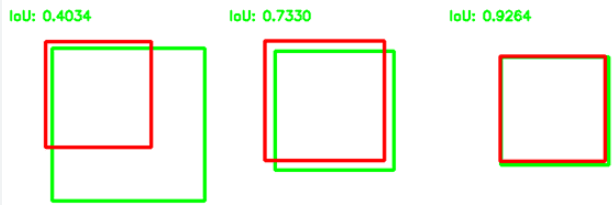

In our case we set the iou equal to **0.6**.

In [ ]:
def wbf(boxes, scores, labels, file):
    iou_thr = 0.6
    boxes, scores, labels = weighted_boxes_fusion([boxes], [scores], [labels], weights=None, iou_thr=iou_thr, skip_box_thr=0.0001)
    for i in range(len(boxes)):
        boxes[i] = convert_x1y1x2y2_to_yolo(boxes[i])
    with open("labels/"+file, "w") as f:
        for i in range(len(boxes)):
            f.write(f'{int(labels[i])} {boxes[i][0]} {boxes[i][1]} {boxes[i][2]} {boxes[i][3]}\n')

In [ ]:
def do_box_fusion(input_dir, output_dir):
  os.makedirs(output_dir, exist_ok = True)
  for file in tqdm(os.listdir(input_dir)):
      if file.endswith(".txt"):
          with open(input_dir+ "/" +file, "r") as f:
              lines = f.readlines()
              boxes = []
              scores = []
              labels = []
              for line in lines:
                  line = line.split(" ")
                  boxes.append([float(line[1]), float(line[2]), float(line[3]), float(line[4])])
                  scores.append(float(1))
                  labels.append(int(line[0]))
              for i in range(len(boxes)):
                  boxes[i] = convert_yolo_to_x1y1x2y2(boxes[i])
              wbf(boxes, scores, labels, file)

In [ ]:
do_box_fusion('labels_dataset', 'labels')

  0%|          | 0/4394 [00:00<?, ?it/s]

Check for the lables after fusion

In [ ]:
with open("labels_dataset/9a5094b2563a1ef3ff50dc5c7ff71345.txt") as file:
    for line in file:
        print(line)
print("-----------------------------------------------------------------------------")
with open("labels/9a5094b2563a1ef3ff50dc5c7ff71345.txt") as file:
    for line in file:
        print(line)

3 0.5634615384615385 0.6862157534246576 0.46249999999999997 0.1952054794520548

10 0.8807692307692307 0.7964469178082192 0.04134615384615381 0.11258561643835618

11 0.8807692307692307 0.7964469178082192 0.04134615384615381 0.11258561643835618

3 0.5646634615384615 0.6793664383561644 0.46394230769230765 0.18150684931506844

3 0.5661057692307693 0.658390410958904 0.4697115384615385 0.19263698630136983

0 0.5651442307692307 0.3598030821917808 0.11875000000000002 0.1074486301369863

-----------------------------------------------------------------------------
0 0.5651442307692307 0.3598030821917808 0.11874999999999991 0.10744863013698636

11 0.8807692307692307 0.7964469178082192 0.04134615384615392 0.11258561643835607

10 0.8807692307692307 0.7964469178082192 0.04134615384615392 0.11258561643835607

3 0.5647436231374741 0.674657553434372 0.4653846323490143 0.18978315591812134



### Split of the dataset

We divide our dataset into a train and a validation dataset. We use the function *GroupKFold(n_splits)* to perfrom Group K-Fold dataset division.

In [ ]:
fold = 4
n_splits = 5

def split_dataset(df, fold, n_splits):
  gkf  = GroupKFold(n_splits)
  df['fold'] = -1
  for fold, (train_idx, val_idx) in enumerate(gkf.split(train_df, groups = train_df.image_id.tolist())):
      train_df.loc[val_idx, 'fold'] = fold

In [ ]:
split_dataset(train_df, n_folds, n_splits)
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area,fold
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,vinbigdata-512-image-dataset/train/9a5094b2563...,0.563462,0.686216,0.462500,0.195205,0.090283,3
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,vinbigdata-512-image-dataset/train/051132a778e...,0.623915,0.305903,0.150608,0.095833,0.014433,2
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,vinbigdata-512-image-dataset/train/1c32170b4af...,0.309843,0.128581,0.125984,0.024740,0.003117,4
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,vinbigdata-512-image-dataset/train/0c7a38f293d...,0.773523,0.472407,0.368053,0.753033,0.277156,2
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,vinbigdata-512-image-dataset/train/47ed17dcb2c...,0.239875,0.721145,0.045950,0.039368,0.001809,4


**3/4** of dataset for **train ,
1/4** of dataset for **validation**

In [ ]:
train_files = []
val_files   = []

# All files with fold number 4
val_files += list(train_df[train_df.fold==fold].image_path.unique())
# All files with other fold number
train_files += list(train_df[train_df.fold!=fold].image_path.unique())
len(train_files), len(val_files)

(3515, 879)

Images are separete into two files respectively train and val.

In [ ]:
def create_train_files(label_dir, train_files_list):
  os.makedirs('labels/train', exist_ok = True)
  os.makedirs('images/train', exist_ok = True)
  for file in tqdm(train_files_list):
      shutil.copy(file, 'images/train')
      filename = file.split('/')[-1].split('.')[0]
      shutil.copy(os.path.join(label_dir, filename+'.txt'), 'labels/train')

def create_val_files(label_dir, val_files_list):
  os.makedirs('labels/val', exist_ok = True)
  os.makedirs('images/val', exist_ok = True)
  for file in tqdm(val_files_list):
      shutil.copy(file, 'images/train')
      filename = file.split('/')[-1].split('.')[0]
      shutil.copy(os.path.join(label_dir, filename+'.txt'), 'labels/train')

In [ ]:
label_dir = 'labels'

create_train_files(label_dir, train_files)
create_val_files(label_dir, val_files)

  0%|          | 0/3515 [00:00<?, ?it/s]

  0%|          | 0/879 [00:00<?, ?it/s]

### YOLO configuration file

YOLO model need to be feed with a .yaml configuration files within the train images path directory, validation images path directory and the differents classes.

In [ ]:
def get_classes_list(train_df):
  class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
  classes = list(np.array(class_names)[np.argsort(class_ids)])
  classes = list(map(lambda x: str(x), classes))

  return classes

In [ ]:
classes = get_classes_list(train_df)
classes

['Aortic enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung Opacity',
 'Nodule/Mass',
 'Other lesion',
 'Pleural effusion',
 'Pleural thickening',
 'Pneumothorax',
 'Pulmonary fibrosis']

In [ ]:
def create_yolo_cong_file():

  cwd = '/content/'

  with open(join( cwd , 'train.txt'), 'w') as f:
      for path in glob('/content/images/train/*'):
          f.write(path+'\n')

  with open(join( cwd , 'val.txt'), 'w') as f:
      for path in glob('/content/images/val/*'):
          f.write(path+'\n')

  data = dict(
      train =  join( cwd , 'train.txt') ,
      val   =  join( cwd , 'val.txt' ),
      nc    = 14,
      names = classes
      )

  with open(join( cwd , 'vinbigdata.yaml'), 'w') as outfile:
      yaml.dump(data, outfile, default_flow_style=False)

  f = open(join( cwd , 'vinbigdata.yaml'), 'r')
  print('\nyaml:')
  print(f.read())

In [ ]:
create_yolo_cong_file()


yaml:
names:
- Aortic enlargement
- Atelectasis
- Calcification
- Cardiomegaly
- Consolidation
- ILD
- Infiltration
- Lung Opacity
- Nodule/Mass
- Other lesion
- Pleural effusion
- Pleural thickening
- Pneumothorax
- Pulmonary fibrosis
nc: 14
train: /content/train.txt
val: /content/val.txt



### Install YOLOv5

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5

os.chdir('/content/yolov5')
%pip install -qr requirements.txt # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.13.1+cu116 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


## Training and Validation

### Selecting Models
In this notebok I'm using `v5x`. To select your prefered model just replace `--cfg models/yolov5x.yaml --weights yolov5s.pt` with the following command:
* `v5s` : `--cfg models/yolov5s.yaml --weights yolov5s.pt`
* `v5m` : `--cfg models/yolov5m.yaml --weights yolov5m.pt`
* `v5l` : `--cfg models/yolov5l.yaml --weights yolov5l.pt`
* `v5x` : `--cfg models/yolov5x.yaml --weights yolov5x.pt`

In [ ]:
!python train.py --img 640 --batch 16 --epochs 30 --data /content/vinbigdata.yaml --weights yolov5x.pt --cache

train: weights=yolov5x.pt, cfg=, data=/content/vinbigdata.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-120-g3e55763 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7,

In [ ]:
!python val.py --weights /content/yolov5/runs/train/exp/weights/best.pt --data /content/vinbigdata.yaml

val: data=/content/vinbigdata.yaml, weights=['/content/yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-120-g3e55763 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 322 layers, 86260891 parameters, 0 gradients, 204.0 GFLOPs
val: Scanning /content/val.cache... 879 images, 0 backgrounds, 0 corrupt: 100% 879/879 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 28/28 [00:56<00:00,  2.03s/it]
                   all        879       5200      0.493      0.404      0.388      0.188
    Aortic enlargement        879        744      0.755      0.754      0.837      0.521
           Atelectasis        

### Class Distribution

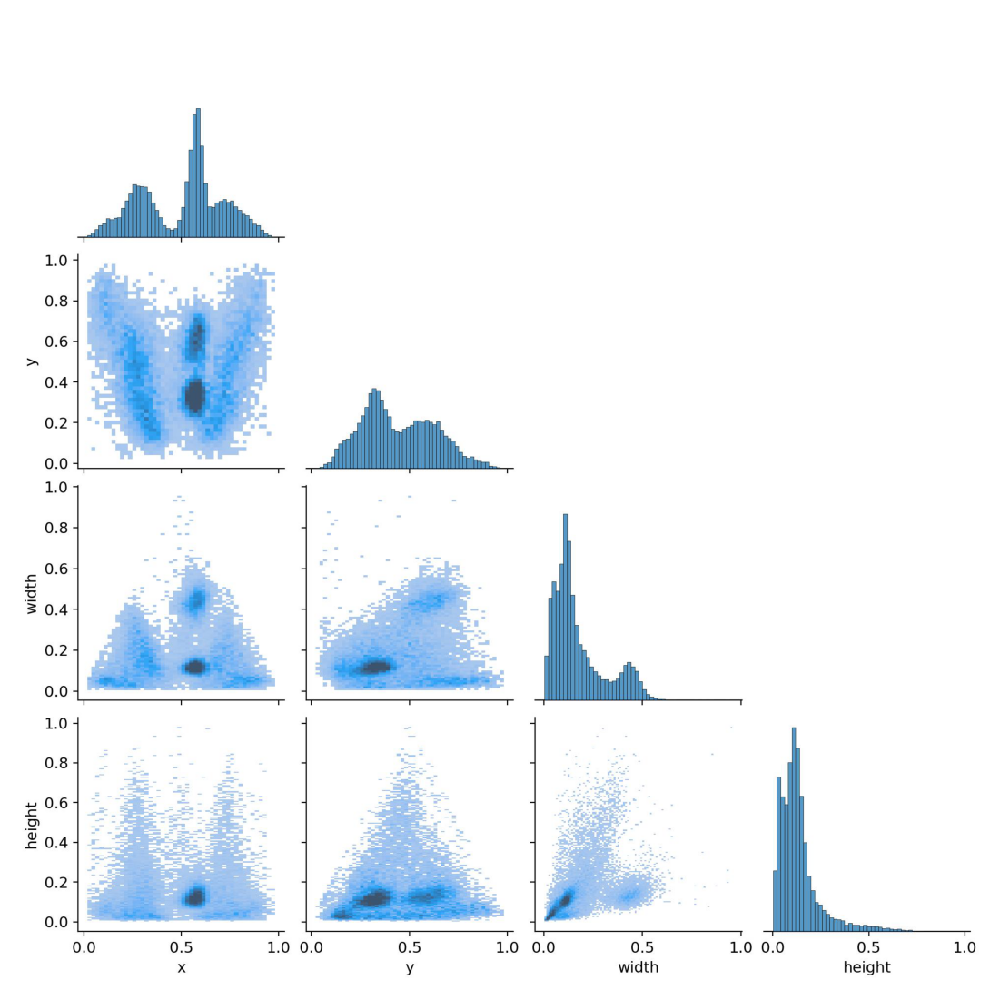

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/labels_correlogram.jpg'));

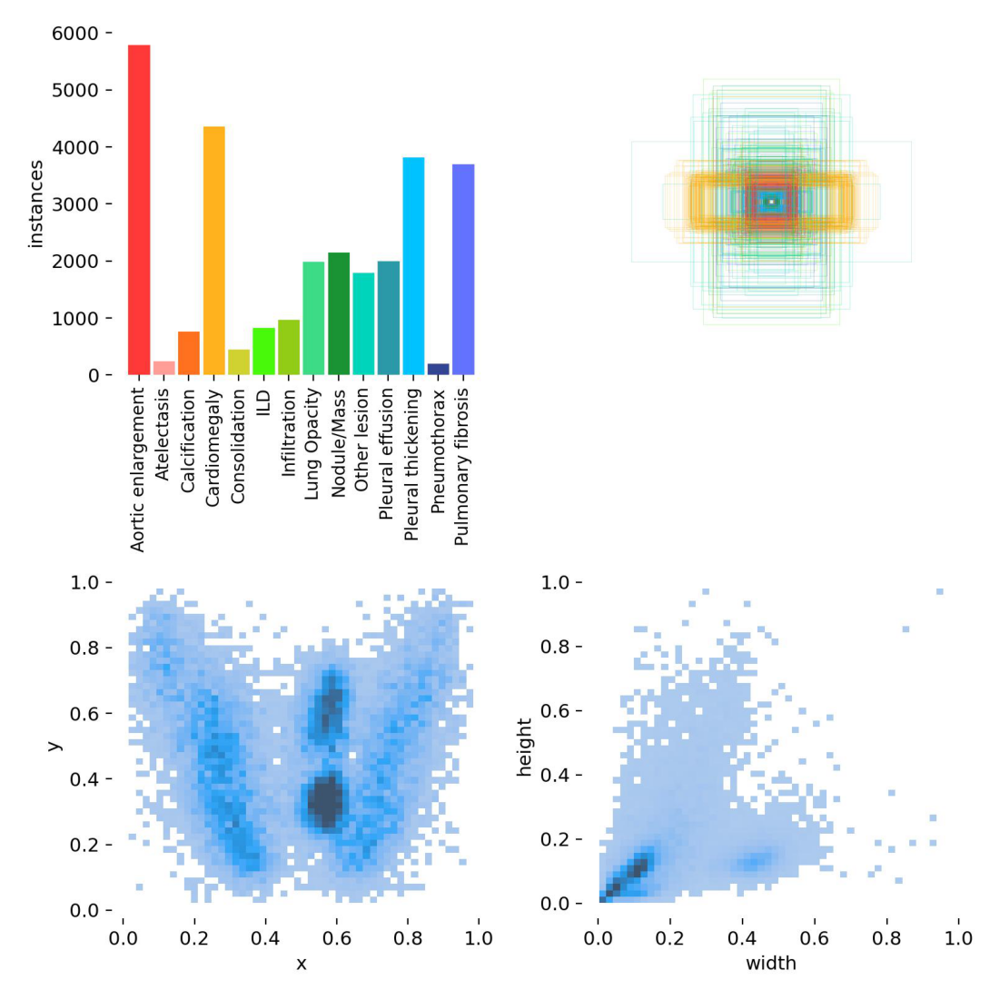

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/labels.jpg'));

### Batch Image

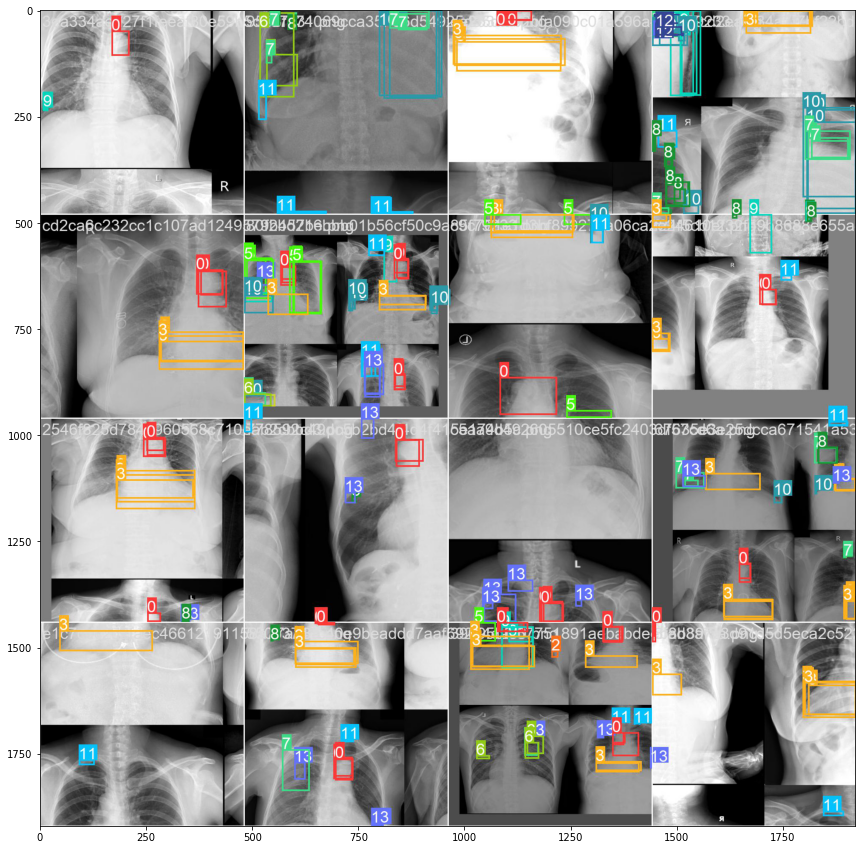

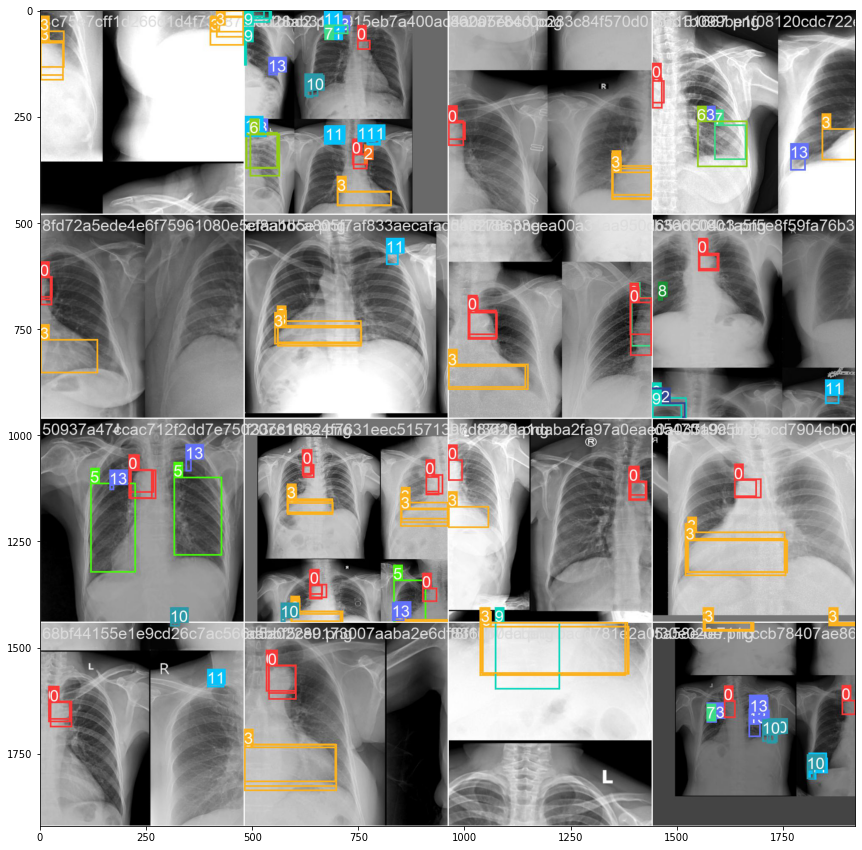

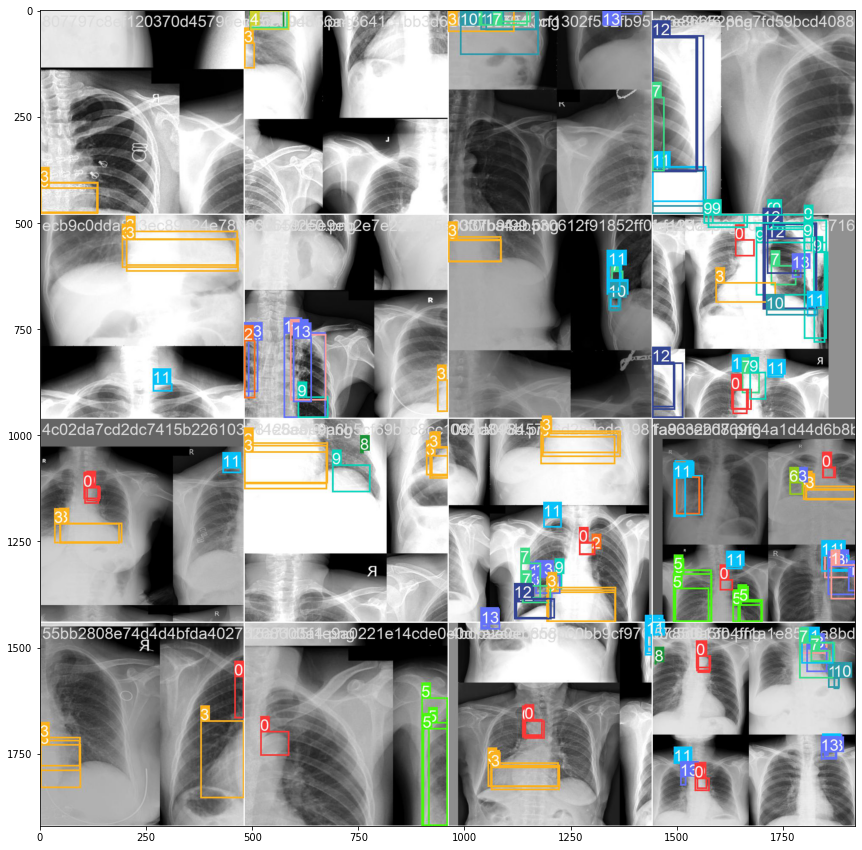

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch0.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch1.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch2.jpg'))


### GT Vs Pred

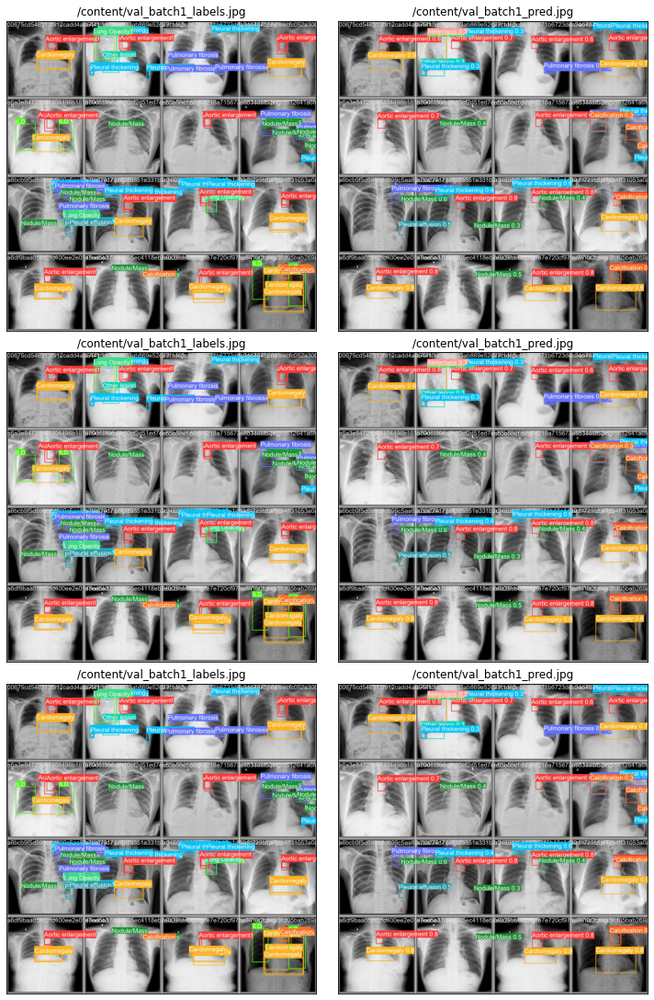

In [ ]:
fig, ax = plt.subplots(3, 2, figsize = (2*5,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'/content/yolov5/runs/val/exp/val_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'/content/yolov5/runs/val/exp/val_batch{row}_labels.jpg', fontsize = 12)

    ax[row][1].imshow(plt.imread(f'/content/yolov5/runs/val/exp/val_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'/content/yolov5/runs/val/exp/val_batch{row}_pred.jpg', fontsize = 12)

### (Loss, Map) Vs Epoch

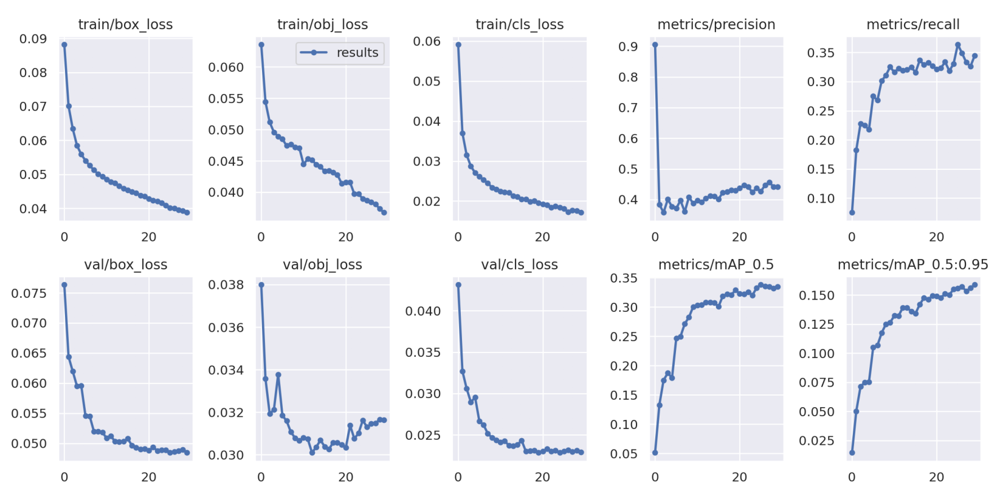

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/results.png'));

### Confusion Matrix

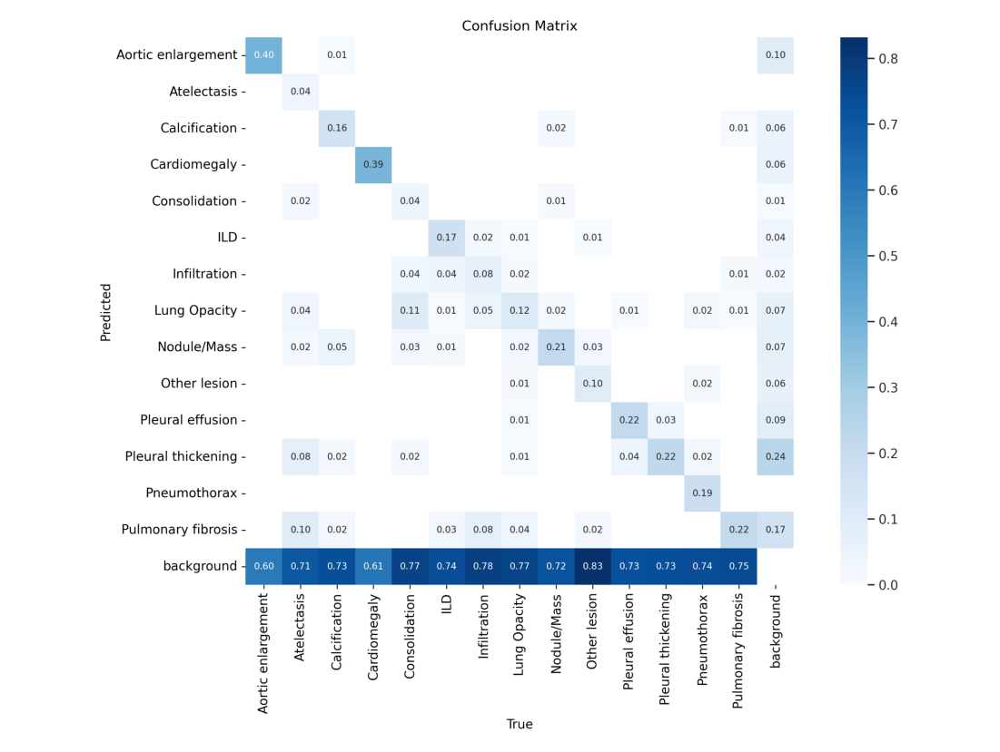

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/val/exp/confusion_matrix.png'));

In [ ]:
# !zip -r /content/train.zip /content/yolov5/runs/train/
# !zip -r /content/val.zip /content/yolov5/runs/val/

## Inference

In [ ]:
# Upload best.pt
# best.pt correspond to the weigth file for the YOLOv5 already trained
uploaded = files.upload()

Import the test dataset

In [ ]:
test_dir = f'/content/vinbigdata-{dim}-image-dataset/test'
weights_dir = '/content/best.pt'

In [ ]:
test_df = pd.read_csv(f'/content/vinbigdata-{dim}-image-dataset/test.csv')
test_df.head()

,image_id,width,height
0,83caa8a85e03606cf57e49147d7ac569,2304,2880
1,7550347fa2bb96c2354a3716dfa3a69c,2538,3095
2,74b23792db329cff5843e36efb8aa65a,2788,3120
3,94568a546be103177cb582d3e91cd2d8,1994,2430
4,6da36354fc904b63bc03eb3884e0c35c,2056,2376


Start the test with the program file detect.py

In [ ]:
!python detect.py --weights $weights_dir\
--img 640\
--conf 0.1\
--iou 0.4\
--source $test_dir\
--save-txt --save-conf --exist-ok

### Plot results

100%|██████████| 16/16 [00:00<00:00, 155.06it/s]


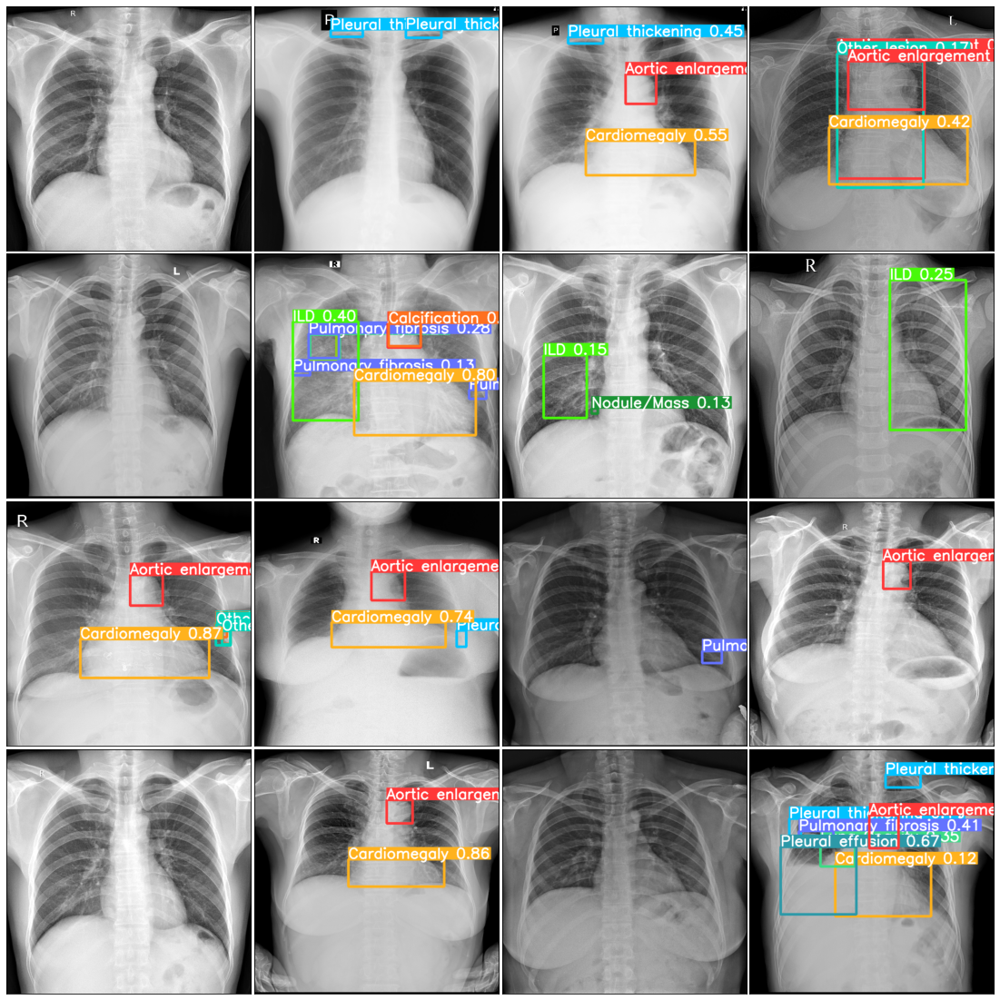

100%|██████████| 16/16 [00:00<00:00, 115.53it/s]


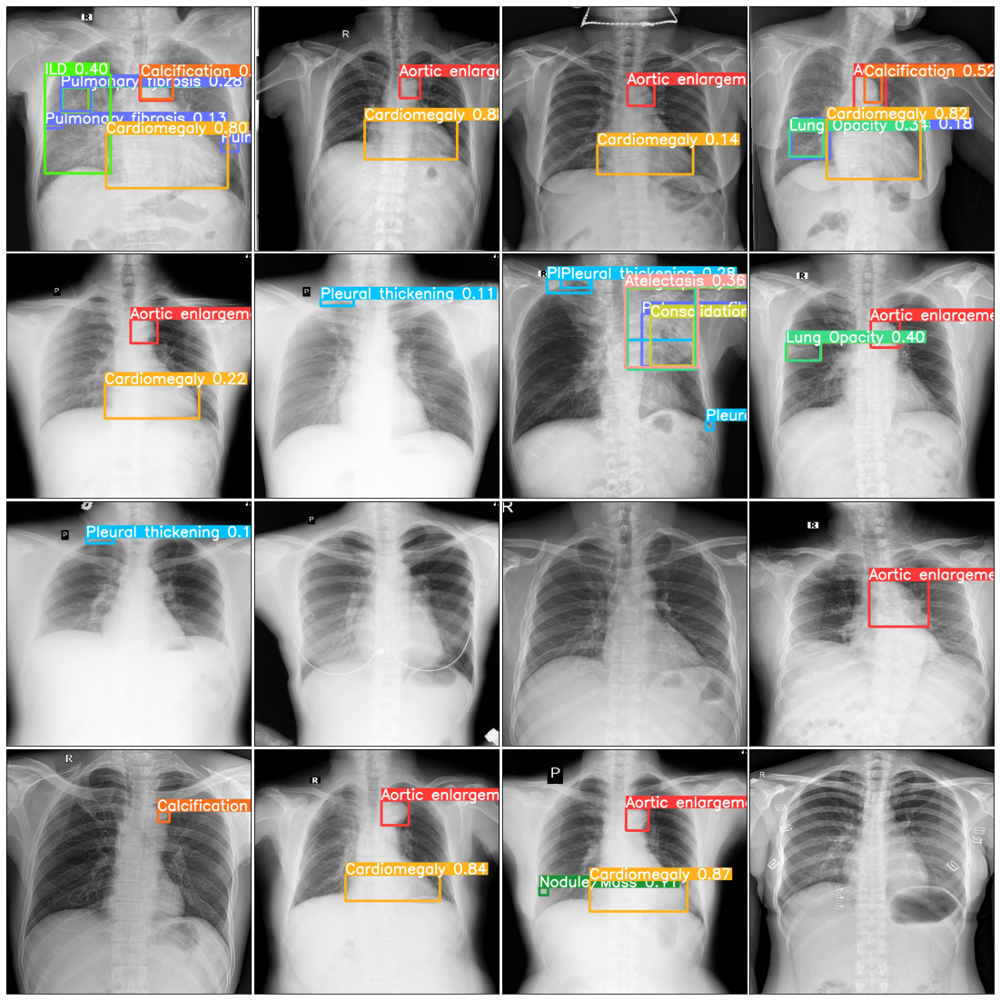

100%|██████████| 16/16 [00:00<00:00, 129.57it/s]


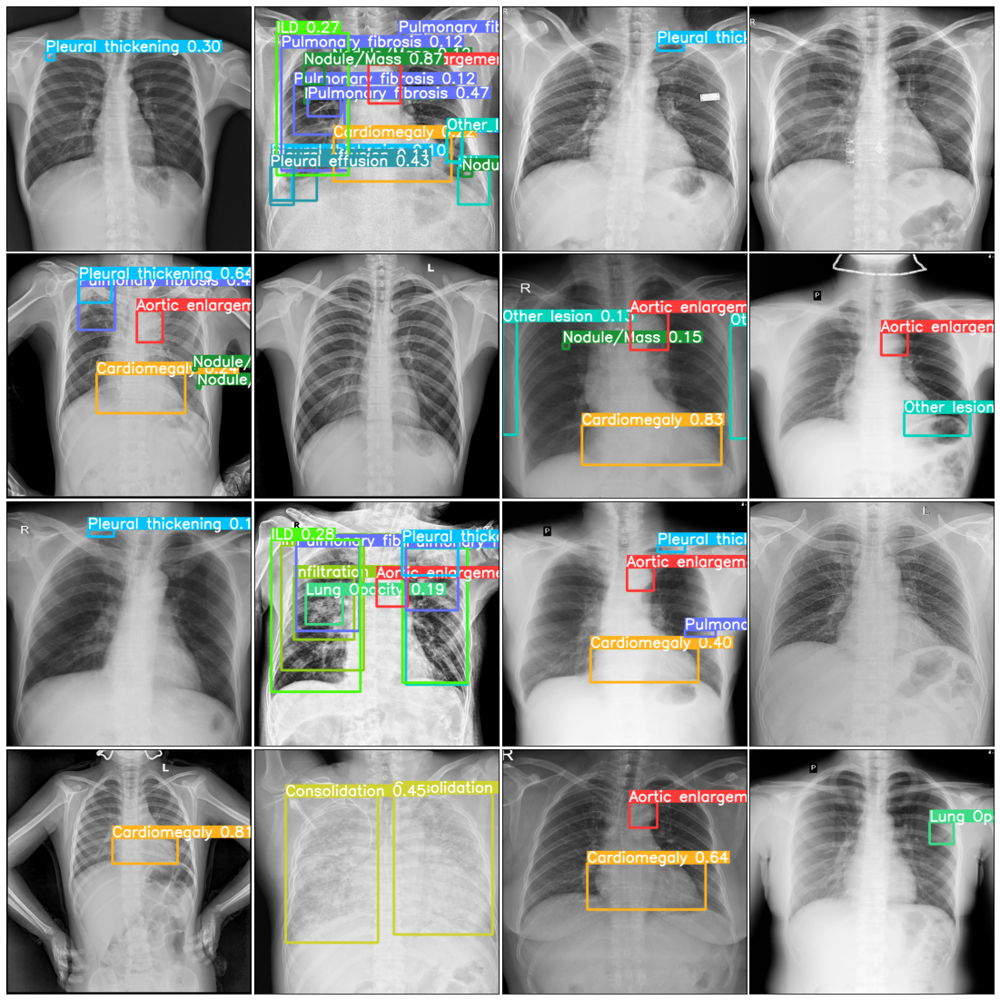

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import random
import cv2
from glob import glob
from tqdm import tqdm

files = glob('runs/detect/exp/*png')
for _ in range(3):
    row = 4
    col = 4
    grid_files = random.sample(files, row*col)
    images     = []
    for image_path in tqdm(grid_files):
        img          = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        images.append(img)

    fig = plt.figure(figsize=(col*5, row*5))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(col, row),  # creates 2x2 grid of axes
                     axes_pad=0.05,  # pad between axes in inch.
                     )

    for ax, im in zip(grid, images):
        # Iterating over the grid returns the Axes.
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()

## Process Submission

The function yolo2voc is use to convert the labels create by YOLO from the yolo format to the voc pascal format need for the competiton submission file

In [ ]:
def yolo2voc(image_height, image_width, bboxes):
    """
    yolo => [xmid, ymid, w, h] (normalized)
    voc  => [x1, y1, x2, y1]

    """
    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int

    bboxes[..., [0, 2]] = bboxes[..., [0, 2]]* image_width
    bboxes[..., [1, 3]] = bboxes[..., [1, 3]]* image_height

    bboxes[..., [0, 1]] = bboxes[..., [0, 1]] - bboxes[..., [2, 3]]/2
    bboxes[..., [2, 3]] = bboxes[..., [0, 1]] + bboxes[..., [2, 3]]

    return bboxes

In [ ]:
def create_submission_file():
  image_ids = []
  PredictionStrings = []

  for file_path in tqdm(glob('runs/detect/exp/labels/*txt')):
      image_id = file_path.split('/')[-1].split('.')[0]
      w, h = test_df.loc[test_df.image_id==image_id,['width', 'height']].values[0]
      f = open(file_path, 'r')
      data = np.array(f.read().replace('\n', ' ').strip().split(' ')).astype(np.float32).reshape(-1, 6)
      data = data[:, [0, 5, 1, 2, 3, 4]]
      bboxes = list(np.round(np.concatenate((data[:, :2], np.round(yolo2voc(h, w, data[:, 2:]))), axis =1).reshape(-1), 1).astype(str))
      for idx in range(len(bboxes)):
         bboxes[idx] = str(int(float(bboxes[idx]))) if idx%6!=1 else bboxes[idx]
      image_ids.append(image_id)
      PredictionStrings.append(' '.join(bboxes))

  pred_df = pd.DataFrame({'image_id':image_ids,
                        'PredictionString':PredictionStrings})
  sub_df = pd.merge(test_df, pred_df, on = 'image_id', how = 'left').fillna("14 1 0 0 1 1")
  sub_df = sub_df[['image_id', 'PredictionString']]
  sub_df.to_csv('/content/submission.csv',index = False)

In [ ]:
create_submission_file()

sub_df = pd.read_csv('/content/submission.csv')
sub_df.tail()

100%|██████████| 2309/2309 [00:02<00:00, 808.37it/s]


,image_id,PredictionString
2995,7f5503caa936a623b4388fbd88e890c5,0 0.2 1362 799 1651 1065
2996,c97e54a78bab9c05ce2e04fe6c284bcd,11 0.1 1062 588 1446 708 11 0.3 1848 582 2274 ...
2997,33218cf183c1224a74ccfb514e827e15,9 0.1 652 543 1072 1529 11 0.1 995 421 1191 49...
2998,04b700c4815f088728db9f093c739707,0 0.5 1295 1065 1582 1340 11 0.5 718 586 1048 682
2999,14da9051525bd2504dd56938f92644ef,0 0.4 985 812 1200 1044


# Effnet Classifier

## Data formating

Import dataset

In [ ]:
# Import train_df
train_df = pd.read_csv(f'/content/vinbigdata-{dim}-image-dataset/train.csv')
# Create path for each images
train_df['image_path'] = f'/content/vinbigdata-{dim}-image-dataset/train/'+train_df.image_id+('.png' if dim!='original' else '.jpg')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580,/content/vinbigdata-512-image-dataset/train/50...
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159,/content/vinbigdata-512-image-dataset/train/21...
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336,/content/vinbigdata-512-image-dataset/train/9a...
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880,/content/vinbigdata-512-image-dataset/train/05...
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072,/content/vinbigdata-512-image-dataset/train/06...


Create the two classes from the 14 previous one: 0 if = 14, 1 if != 14

In [ ]:
def set_class_id_2(df):
    if df['class_id'].nunique() == 1 and df['class_id'].unique()[0] == 14:
        df['class_id_2'] = 0
    else:
        df['class_id_2'] = 1
    return df

merged_df = train_df.groupby('image_id').apply(set_class_id_2)
merged_df = merged_df.drop_duplicates(subset=['image_id'])
merged_df = merged_df[['image_id', 'class_id', 'class_id_2', 'image_path']]
merged_df = merged_df.reset_index(drop=True)  # Reset the index
merged_df.head()

,image_id,class_id,class_id_2,image_path
0,50a418190bc3fb1ef1633bf9678929b3,14,0,/content/vinbigdata-512-image-dataset/train/50...
1,21a10246a5ec7af151081d0cd6d65dc9,14,0,/content/vinbigdata-512-image-dataset/train/21...
2,9a5094b2563a1ef3ff50dc5c7ff71345,3,1,/content/vinbigdata-512-image-dataset/train/9a...
3,051132a778e61a86eb147c7c6f564dfe,0,1,/content/vinbigdata-512-image-dataset/train/05...
4,063319de25ce7edb9b1c6b8881290140,14,0,/content/vinbigdata-512-image-dataset/train/06...


In [ ]:
positiv_files = []
negativ_files   = []
positiv_files += list(merged_df[merged_df.class_id_2==1].image_path.unique())
negativ_files += list(merged_df[merged_df.class_id_2!=1].image_path.unique())
len(positiv_files), len(negativ_files)

(4394, 10606)

Divide the dataset in training and validation sub-dataset

In [ ]:
gkf  = GroupKFold(n_splits = 5)
merged_df['fold'] = -1
for fold, (train_idx, val_idx) in enumerate(gkf.split(merged_df, groups = merged_df.image_id.tolist())):
    merged_df.loc[val_idx, 'fold'] = fold
merged_df.head()

,image_id,class_id,class_id_2,image_path,fold
0,50a418190bc3fb1ef1633bf9678929b3,14,0,/content/vinbigdata-512-image-dataset/train/50...,3
1,21a10246a5ec7af151081d0cd6d65dc9,14,0,/content/vinbigdata-512-image-dataset/train/21...,4
2,9a5094b2563a1ef3ff50dc5c7ff71345,3,1,/content/vinbigdata-512-image-dataset/train/9a...,3
3,051132a778e61a86eb147c7c6f564dfe,0,1,/content/vinbigdata-512-image-dataset/train/05...,1
4,063319de25ce7edb9b1c6b8881290140,14,0,/content/vinbigdata-512-image-dataset/train/06...,0


In [ ]:
val_df = merged_df[merged_df.fold==fold]
val_df = val_df.reset_index(drop=True)
train_df = merged_df[merged_df.fold!=fold]
train_df = train_df.reset_index(drop=True)

len(val_df), len(train_df)

(3000, 12000)

## Model creation

In [ ]:
pip install timm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 KB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.8/199.8 KB 20.1 MB/s eta 0:00:00


We create the objects that represent our models

In [ ]:
import torch.nn as nn
from torch.nn import Linear
import torch as torch
import timm

# class CNNFixedPredictor(nn.Module):
#     def __init__(self, cnn: nn.Module, num_classes: int = 2):
#         super(CNNFixedPredictor, self).__init__()
#         self.cnn = cnn
#         self.lin = Linear(cnn.num_features, num_classes)
#         print("cnn.num_features", cnn.num_features)

#         for param in self.cnn.parameters():
#             param.requires_grad = False

#     def forward(self, x):
#         feat = self.cnn(x)
#         return self.lin(feat)

class CNNPredictor(nn.Module):
    def __init__(self, cnn: nn.Module, num_classes: int = 2):
        super(CNNPredictor, self).__init__()
        self.cnn = cnn
        self.lin = Linear(cnn.num_features, num_classes) # Last FullConnected layer (ex: Linear(1535,2))
        print("cnn.num_features", cnn.num_features)

    def forward(self, x):
        feat = self.cnn(x)
        return self.lin(feat)

We create the model by importing one model from timm library.
When the model is created we send it to the GPU.

In [ ]:
# #Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

# timm_model = timm.create_model('resnet18', pretrained=True, num_classes=0, in_chans=3)
timm_model = timm.create_model('tf_efficientnet_b3_ns', pretrained=True, num_classes=0, in_chans=3)

model = CNNPredictor(timm_model, num_classes=2).to(device)

print(model)

cuda


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b3_ns-9d44bf68.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b3_ns-9d44bf68.pth


cnn.num_features 1536
CNNPredictor(
  (cnn): EfficientNet(
    (conv_stem): Conv2dSame(3, 40, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn1): BatchNormAct2d(
      40, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): SiLU(inplace=True)
    )
    (blocks): Sequential(
      (0): Sequential(
        (0): DepthwiseSeparableConv(
          (conv_dw): Conv2d(40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=40, bias=False)
          (bn1): BatchNormAct2d(
            40, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
            (drop): Identity()
            (act): SiLU(inplace=True)
          )
          (se): SqueezeExcite(
            (conv_reduce): Conv2d(40, 10, kernel_size=(1, 1), stride=(1, 1))
            (act1): SiLU(inplace=True)
            (conv_expand): Conv2d(10, 40, kernel_size=(1, 1), stride=(1, 1))
            (gate): Sigmoid()
          )
          (conv_pw): Conv2d(40, 24, kerne

Creation of our Dataset class.

In [ ]:
from torch.utils.data import Dataset
import cv2

class MyDataset(Dataset):
    def __init__(self,data, labels, transform=True):
        self.data = data
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self,idx):
        img_path = self.data[idx]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)

        label = self.labels[idx]

        if self.transform:
            transformed = self.transform(image=image)
            image = transformed['image']

        return image,label

Setting the images augmentations.

In [ ]:
import torchvision.transforms as transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose(
[
    A.Resize(height=300, width=300),
    A.RandomScale(scale_limit=(-0.9, 1.0), p=1.0),
    A.PadIfNeeded(
        min_height=300,
        min_width=300,
        border_mode=cv2.BORDER_CONSTANT,
        value=0,
        p=1.0,
    ),
    A.RandomCrop(height=250, width=250, p=1.0),
    A.RandomBrightnessContrast(p=0.8),
    A.ChannelDropout(p=0.5),
    A.OneOf(
        [
            A.MotionBlur(p=0.5),
            A.MedianBlur(p=0.5),
            A.GaussianBlur(p=0.5),
            A.GaussNoise(p=0.5),
        ],
        p=0.5,
    ),
    A.HorizontalFlip(p=0.5),
    A.Normalize(),
    ToTensorV2(),
],)

Creation of the dataloarders.

In [ ]:
from torch.utils.data import DataLoader, Dataset

batch_size = 32

train_dataset = MyDataset(data=train_df['image_path'], labels=train_df['class_id_2'], transform=train_transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

val_dataset = MyDataset(data=val_df['image_path'], labels=val_df['class_id_2'], transform=train_transform )
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

Setting of the optimizer and the loss function for our model

In [ ]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

## Training

In [ ]:
import torch as torch

In [ ]:
from tqdm import tqdm

num_epochs = 15
val_acc_list = []

for epoch in range(num_epochs):
    train_loss = 0.0
    train_correct = 0
    train_total = 0

    model.train()
    with tqdm(total=len(train_loader), desc=f'Epoch {epoch+1}/{num_epochs}', unit='batch') as pbar:
        for batch_idx, (data, target) in enumerate(train_loader):
            # Move data to the device
            data, target = data.to(device), target.to(device)

            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

            # compute training loss and accuracy
            train_loss += loss.item() * data.size(0)
            _, predicted = torch.max(output.data, 1)
            train_total += target.size(0)
            train_correct += (predicted == target).sum().item()

            # update progress bar
            pbar.update(1)
            pbar.set_postfix({'Loss': loss.item(), 'Accuracy': 100. * train_correct / train_total})

    train_loss /= len(train_loader.dataset)
    train_acc = 100. * train_correct / train_total

    # Evaluate on the validation set
    val_correct = 0
    val_total = 0
    model.eval()
    with torch.no_grad():
        for data, target in val_loader:

            data, target = data.to(device), target.to(device)

            output = model(data)
            _, predicted = torch.max(output.data, 1)
            val_total += target.size(0)
            val_correct += (predicted == target).sum().item()

    val_acc = 100. * val_correct / val_total
    val_acc_list.append(val_acc)
    best_acc = max(val_acc_list)

    if val_acc >= best_acc :
        best_weights = model.state_dict()
        print("saved best weights")

    # Print training and validation losses and accuracies
    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Training Loss: {train_loss:.3f}, '
          f'Training Accuracy: {train_acc:.3f}, '
          f'Validation Accuracy: {val_acc:.3f}')

model.load_state_dict(best_weights)

Epoch 1/15: 100%|██████████| 375/375 [04:44<00:00,  1.32batch/s, Loss=0.403, Accuracy=78.6]


saved best weights
Epoch 1/15, Training Loss: 0.463, Training Accuracy: 78.617, Validation Accuracy: 83.500


Epoch 2/15: 100%|██████████| 375/375 [04:08<00:00,  1.51batch/s, Loss=0.285, Accuracy=84.6]


saved best weights
Epoch 2/15, Training Loss: 0.358, Training Accuracy: 84.642, Validation Accuracy: 85.433


Epoch 3/15: 100%|██████████| 375/375 [04:09<00:00,  1.50batch/s, Loss=0.362, Accuracy=85.9]


saved best weights
Epoch 3/15, Training Loss: 0.329, Training Accuracy: 85.942, Validation Accuracy: 88.367


Epoch 4/15:  60%|█████▉    | 224/375 [02:28<01:37,  1.56batch/s, Loss=0.251, Accuracy=86.9]

In [ ]:
torch.save(model.state_dict(), '/content/model.pth')

# Inference

In [ ]:
# Upload model.pth
uploaded = files.upload()

Recreate the model from imported weigths

In [ ]:
# #Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

timm_model = timm.create_model('tf_efficientnet_b3_ns', pretrained=True, num_classes=0, in_chans=3)

model = CNNFixedPredictor(timm_model, num_classes=2).to(device)
model.load_state_dict(torch.load('/content/model.pth'))

import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

Check the accuracy of the model

In [ ]:
correct = 0
total = 0
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for batch_idx, (data, target) in tqdm(enumerate(val_loader), total=len(val_loader)):
            # Move data to the device
        data, target = data.to(device), target.to(device)
        # calculate outputs by running images through the network
        outputs = model(data)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()

print(f'Accuracy of the network on the val images: {100 * correct // total} %')

Do the detection with the model on the test dataset

In [ ]:
from PIL import Image
import torch.nn.functional as F
# define image transform for test data
test_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# load test data

model.eval()

# create a list to store the results
results = []

# loop over the images in the "512/test" folder
for filename in tqdm(os.listdir(f'/kaggle/input/vinbigdata-{dim}-image-dataset/vinbigdata/test')):
    # open the image using PIL and apply the image transform
    img = Image.open(os.path.join(f'/kaggle/input/vinbigdata-{dim}-image-dataset/vinbigdata/test', filename)).convert('RGB')
    img = test_transforms(img)
    img = img.unsqueeze(0).to(device)

    # make predictions on the image
    with torch.no_grad():
        output = model(img)
        _, predicted = torch.max(output.data, 1)
        probs = F.softmax(output, dim=1)
        conf = probs[:, 1]
        results.append((filename.split('.')[0], predicted.item(), conf.item()))

# store the results in a pandas dataframe
pred_2cls = pd.DataFrame(results, columns=['image_id', 'prediction', 'confidence'])
pred_2cls

# Merging YOLO and Classifer results

Create the submission file from the submission obtained with YOLO

In [ ]:
pred_14cls = pd.read_csv('/content/submission.csv')
pred_14cls

In [ ]:
pred = pd.merge(pred_14cls, pred_2cls, on = 'image_id', how = 'left')
pred.head()

In [ ]:
pred['PredictionString'].value_counts().iloc[[0]]

Merge the two results

In [ ]:
low_thr  = 0.08
high_thr = 0.95

def filter_2cls(row, low_thr=low_thr, high_thr=high_thr):
    prob = row['confidence']
    if prob<low_thr:
        ## Less chance of having any disease
        row['PredictionString'] = '14 1 0 0 1 1'
    elif low_thr<=prob<high_thr:
        ## More change of having any diesease
        row['PredictionString']+=f' 14 {prob} 0 0 1 1'
    elif high_thr<=prob:
        ## Good chance of having any disease so believe in object detection model
        row['PredictionString'] = row['PredictionString']
    else:
        raise ValueError('Prediction must be from [0-1]')
    return row

In [ ]:
sub = pred.apply(filter_2cls, axis=1)
sub.head()

In [ ]:
sub['PredictionString'].value_counts().iloc[[0]]

Create the final submission file

In [ ]:
sub[['image_id', 'PredictionString']].to_csv('submission.csv',index = False)